# TC. ÜSKÜDAR ÜNİVERSİTESİ SAYISAL GÖRÜNTÜ İŞLEME DERSİ ARA SINAV ÖDEVİ

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### 1. Veri Yükleme

#### 1.1 Kütüphanelerin İçe Aktarılması

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import PIL

%matplotlib inline

#### 1.2 Veri Setinin Yüklenmesi

In [3]:
import os

DATASET_PATH = "/content/drive/MyDrive/Colab Notebooks/Homework/data/Skin cancer ISIC The International Skin Imaging Collaboration"

image_paths = []
for root, dirs, files in os.walk(DATASET_PATH):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(root, file))

train_df = pd.DataFrame({'path': image_paths})

print("--- DataFrame İlk 5 Satır ---")
print(train_df.head())

print("\n--- Toplam Görüntü Sayısı ---")
print(len(train_df))

--- DataFrame İlk 5 Satır ---
                                                path
0  /content/drive/MyDrive/Colab Notebooks/Homewor...
1  /content/drive/MyDrive/Colab Notebooks/Homewor...
2  /content/drive/MyDrive/Colab Notebooks/Homewor...
3  /content/drive/MyDrive/Colab Notebooks/Homewor...
4  /content/drive/MyDrive/Colab Notebooks/Homewor...

--- Toplam Görüntü Sayısı ---
2357


#### 1.3 Veri Özelliklerinin İncelenmesi

In [4]:
heights = []
widths = []
channels = []
file_sizes = []

print("\nGörüntü özellikleri analiz ediliyor...")

for img_path in train_df['path']:
    # 1. Dosya boyutu (KB cinsinden)
    size_bytes = os.path.getsize(img_path)
    file_sizes.append(size_bytes / 1024)

    # 2. Görüntü okuma ve özellikler
    img = cv2.imread(img_path)

    if img is not None:
        h, w = img.shape[:2]
        heights.append(h)
        widths.append(w)

        # Kanal sayısı kontrolü (Renkli mi Gri mi?)
        if len(img.shape) == 3:
            c = img.shape[2]
        else:
            c = 1 # Grayscale
        channels.append(c)
    else:
        heights.append(None)
        widths.append(None)
        channels.append(None)

train_df['height'] = heights
train_df['width'] = widths
train_df['channels'] = channels
train_df['file_size_kb'] = file_sizes


Görüntü özellikleri analiz ediliyor...



--- Analiz Sonuçları ---
Ortalama Çözünürlük: 666.52 (Yükseklik) x 886.46 (Genişlik)
Benzersiz Çözünürlükler: height  width
450     600      1512
540     722         1
542     722         4
        724         1
545     722         1
dtype: int64

Tespit Edilen Kanal Sayıları: [3]
Yorum: Veri setinde RGB (3 kanallı) görüntüler bulunmaktadır.


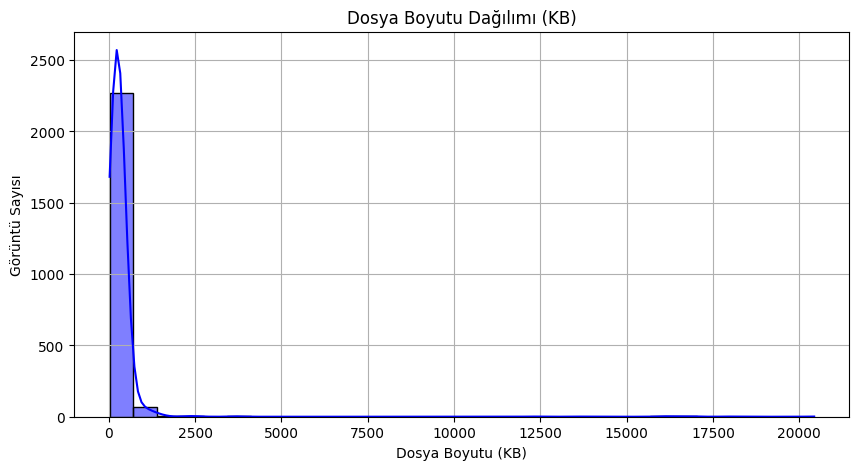

Ortalama Dosya Boyutu: 342.22 KB


In [6]:
print("\n--- Analiz Sonuçları ---")

# 1. Çözünürlük Analizi
avg_height = np.mean([h for h in heights if h is not None])
avg_width = np.mean([w for w in widths if w is not None])
print(f"Ortalama Çözünürlük: {avg_height:.2f} (Yükseklik) x {avg_width:.2f} (Genişlik)")
print(f"Benzersiz Çözünürlükler: {train_df.groupby(['height', 'width']).size().head()}")

# 2. Kanal Sayısı Doğrulaması
unique_channels = train_df['channels'].unique()
print(f"\nTespit Edilen Kanal Sayıları: {unique_channels}")
if 3 in unique_channels:
    print("Yorum: Veri setinde RGB (3 kanallı) görüntüler bulunmaktadır.")
else:
    print("Yorum: Veri seti sadece gri tonlamalı görüntülerden oluşuyor.")

# 3. Dosya Boyutu Dağılımı
plt.figure(figsize=(10, 5))
sns.histplot(train_df['file_size_kb'], kde=True, bins=30, color='blue')
plt.title('Dosya Boyutu Dağılımı (KB)')
plt.xlabel('Dosya Boyutu (KB)')
plt.ylabel('Görüntü Sayısı')
plt.grid(True)
plt.show()

print(f"Ortalama Dosya Boyutu: {train_df['file_size_kb'].mean():.2f} KB")

### 2. Görüntü Yükleme ve Görselleştirme

#### 2.1 Rastgele Görüntüler Seçme

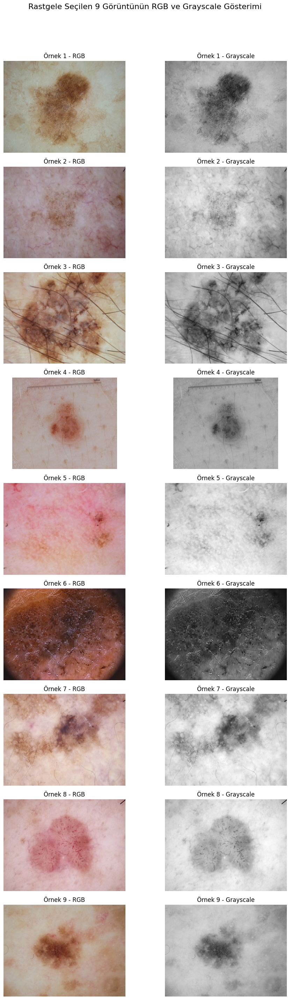

In [7]:
sample_images = train_df.sample(n=9, random_state=42)

fig, axes = plt.subplots(nrows=9, ncols=2, figsize=(10, 30))
fig.suptitle('Rastgele Seçilen 9 Görüntünün RGB ve Grayscale Gösterimi', fontsize=16)

for idx, (i, row) in enumerate(sample_images.iterrows()):
    img_path = row['path']

    img_bgr = cv2.imread(img_path)

    if img_bgr is None:
        print(f"Hata: {img_path} okunamadı.")
        continue

    # RGB Dönüşümü
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Grayscale Dönüşümü
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    axes[idx, 0].imshow(img_rgb)
    axes[idx, 0].set_title(f"Örnek {idx+1} - RGB")
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(img_gray, cmap='gray')
    axes[idx, 1].set_title(f"Örnek {idx+1} - Grayscale")
    axes[idx, 1].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### 2.2 Rastgele Görüntülerin İstatistiksel Özellikleri

In [8]:
stats_data = []

for idx, (i, row) in enumerate(sample_images.iterrows()):
    img_path = row['path']

    # Görüntüyü okuma
    img_bgr = cv2.imread(img_path)

    if img_bgr is not None:
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

        rgb_min = np.min(img_rgb)
        rgb_max = np.max(img_rgb)
        rgb_mean = np.mean(img_rgb)
        rgb_std = np.std(img_rgb)

        gray_min = np.min(img_gray)
        gray_max = np.max(img_gray)
        gray_mean = np.mean(img_gray)
        gray_std = np.std(img_gray)

        # Verileri listeye ekleme
        stats_data.append({
            "Görüntü No": idx + 1,
            "RGB Min": rgb_min, "RGB Max": rgb_max, "RGB Mean": round(rgb_mean, 2), "RGB Std": round(rgb_std, 2),
            "Gray Min": gray_min, "Gray Max": gray_max, "Gray Mean": round(gray_mean, 2), "Gray Std": round(gray_std, 2)
        })

stats_df = pd.DataFrame(stats_data)

print("--- Rastgele 9 Görüntünün İstatistiksel Analizi ---")
try:
    display(stats_df)
except:
    print(stats_df)


print(f"\nGenel RGB Ortalaması: {stats_df['RGB Mean'].mean():.2f}")
print(f"Genel Grayscale Ortalaması: {stats_df['Gray Mean'].mean():.2f}")

--- Rastgele 9 Görüntünün İstatistiksel Analizi ---


,Görüntü No,RGB Min,RGB Max,RGB Mean,RGB Std,Gray Min,Gray Max,Gray Mean,Gray Std
0,1,9,235,147.61,29.53,37,225,151.66,24.66
1,2,8,196,141.19,20.85,19,185,140.01,17.28
2,3,7,240,142.99,40.36,20,236,146.41,34.76
3,4,12,238,159.84,22.16,36,236,160.44,16.90
4,5,16,227,173.26,29.01,39,200,171.13,13.36
5,6,0,255,78.68,39.56,10,255,79.42,29.10
6,7,9,242,177.00,35.61,16,226,178.11,29.76
7,8,3,232,179.06,28.71,5,215,177.51,20.41
8,9,0,236,152.61,32.09,8,225,155.80,24.01



Genel RGB Ortalaması: 150.25
Genel Grayscale Ortalaması: 151.17


#### 2.3 Histogram Çizimi (Zorunlu – RGB + Grayscale)

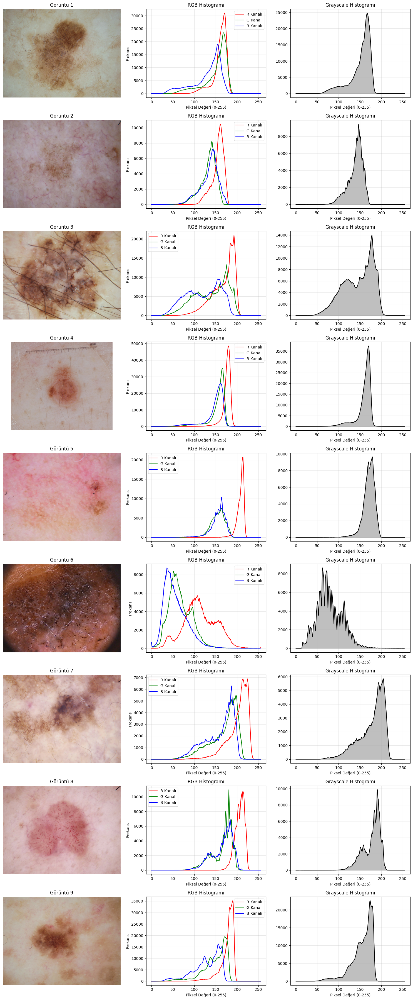

In [9]:
plt.figure(figsize=(15, 4 * len(sample_images)))

for idx, (i, row) in enumerate(sample_images.iterrows()):
    img_path = row['path']
    img_bgr = cv2.imread(img_path)

    if img_bgr is None:
        continue

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)


    # Orijinal Görüntü
    plt.subplot(len(sample_images), 3, idx*3 + 1)
    plt.imshow(img_rgb)
    plt.title(f"Görüntü {idx+1}")
    plt.axis('off')

    # RGB Histogramı
    plt.subplot(len(sample_images), 3, idx*3 + 2)
    colors = ('r', 'g', 'b')
    for color_idx, color in enumerate(colors):
        # cv2.calcHist(görüntü, kanal, maske, bin_sayısı, aralık)
        hist = cv2.calcHist([img_rgb], [color_idx], None, [256], [0, 256])
        plt.plot(hist, color=color, label=f'{color.upper()} Kanalı')

    plt.title("RGB Histogramı")
    plt.xlabel("Piksel Değeri (0-255)")
    plt.ylabel("Frekans")
    plt.legend()
    plt.grid(alpha=0.3)

    # Grayscale Histogramı
    plt.subplot(len(sample_images), 3, idx*3 + 3)
    hist_gray = cv2.calcHist([img_gray], [0], None, [256], [0, 256])

    plt.plot(hist_gray, color='black')
    plt.fill_between(range(256), hist_gray.flatten(), color='gray', alpha=0.5)

    plt.title("Grayscale Histogramı")
    plt.xlabel("Piksel Değeri (0-255)")
    plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

### 3. Görüntü İşleme ve İyileştirme

#### 3.1 Kontrast Germe (Stretching) işlemini hem RGB hem grayscale görüntülere uygulayın.

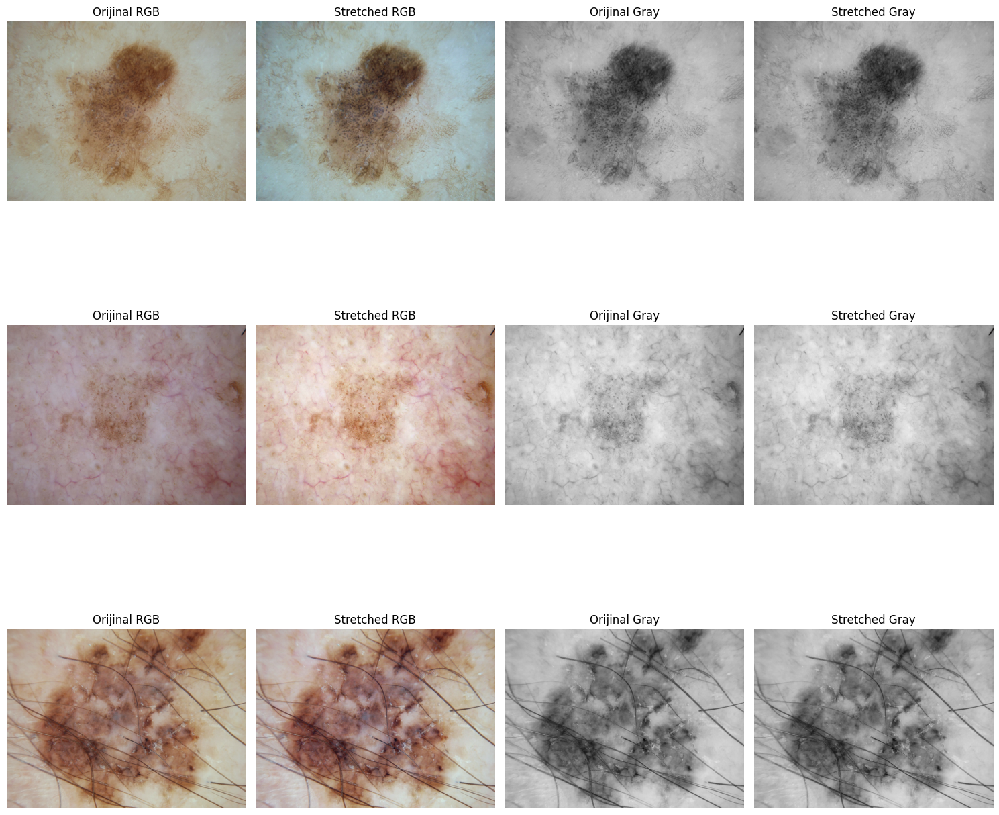

In [10]:
def contrast_stretching(img):
    # Görüntüdeki en düşük (min) ve en yüksek (max) piksel değerlerini bul
    p_min = np.min(img)
    p_max = np.max(img)

    # Formül: (pixel - min) * (255 / (max - min))
    # Eğer görüntü zaten tam kontrastlıysa (0 ve 255 varsa) sıfıra bölünme hatasını önle
    if p_max - p_min == 0:
        return img

    stretched = (img - p_min) * (255.0 / (p_max - p_min))
    return stretched.astype(np.uint8)

# Görselleştirme
num_samples = 3
plt.figure(figsize=(15, 5 * num_samples))

for i in range(num_samples):
    # Veriyi al
    img_path = sample_images.iloc[i]['path']
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: continue

    # Dönüşümler
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # --- Kontrast Germe Uygulama ---
    # RGB: Her kanal (R, G, B) için ayrı ayrı uygulanır
    r, g, b = cv2.split(img_rgb)
    img_rgb_stretched = cv2.merge([contrast_stretching(r), contrast_stretching(g), contrast_stretching(b)])

    # Grayscale: Tek kanal üzerine uygulanır
    img_gray_stretched = contrast_stretching(img_gray)

    # 1. Orijinal RGB vs Stretched RGB
    plt.subplot(num_samples, 4, i*4 + 1)
    plt.imshow(img_rgb)
    plt.title("Orijinal RGB")
    plt.axis('off')

    plt.subplot(num_samples, 4, i*4 + 2)
    plt.imshow(img_rgb_stretched)
    plt.title("Stretched RGB")
    plt.axis('off')

    # 2. Orijinal Gray vs Stretched Gray
    plt.subplot(num_samples, 4, i*4 + 3)
    plt.imshow(img_gray, cmap='gray')
    plt.title("Orijinal Gray")
    plt.axis('off')

    plt.subplot(num_samples, 4, i*4 + 4)
    plt.imshow(img_gray_stretched, cmap='gray')
    plt.title("Stretched Gray")
    plt.axis('off')

plt.tight_layout()
plt.show()

Yorum: Strech işlemi piksel yoğunluklarını dar bir alandan maksimum aralığa (0-255) yayarak kontrastı artırmış, bu sayede hem gri tonlamada yapısal detayların görünürlüğünü hem de RGB'de renklerin canlılığını yükselterek lezyonu sağlıklı deriden daha belirgin şekilde ayırmıştır.

#### 3.2 Histogram Eşitleme (Equalization)

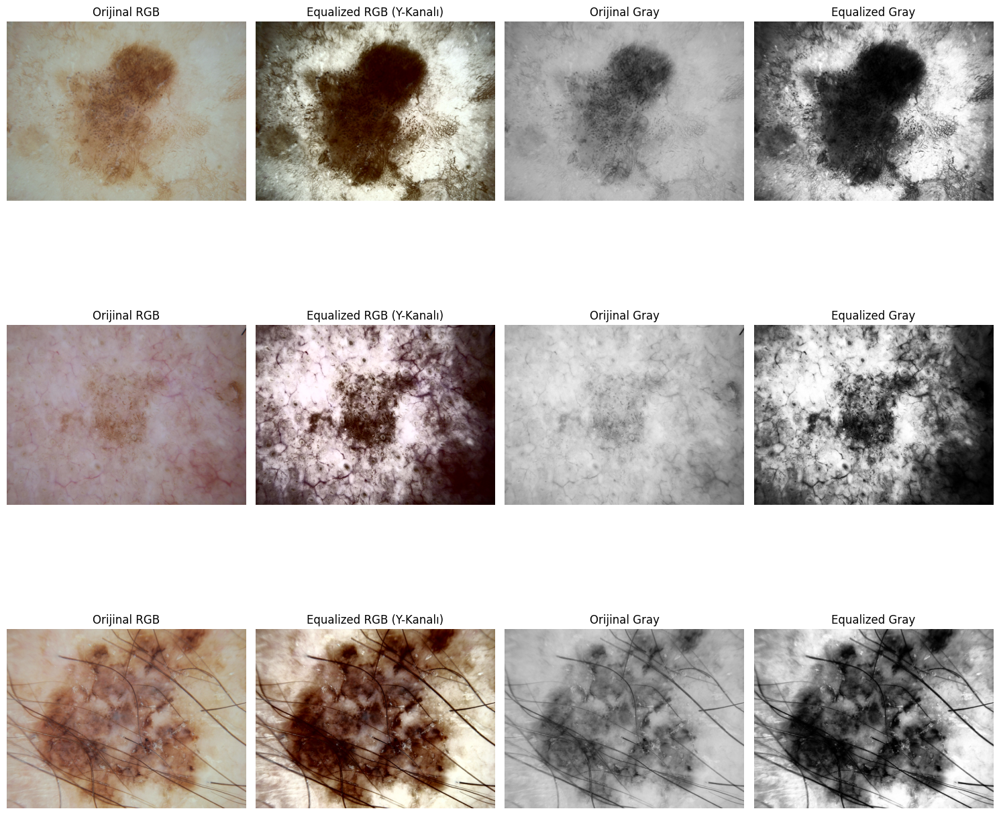

In [11]:
def histogram_equalization_rgb(img_rgb):
    # 1. RGB -> YCrCb dönüşümü
    ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)

    # 2. Kanalları ayır (Y: Parlaklık, Cr, Cb: Renk)
    y, cr, cb = cv2.split(ycrcb)

    # 3. Sadece Y kanalına histogram eşitleme uygula
    y_eq = cv2.equalizeHist(y)

    # 4. Kanalları birleştir
    ycrcb_eq = cv2.merge([y_eq, cr, cb])

    # 5. Tekrar RGB'ye dönüştür
    return cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2RGB)

# Görselleştirme
plt.figure(figsize=(15, 5 * num_samples))

for i in range(num_samples):
    img_path = sample_images.iloc[i]['path']
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: continue

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # RGB
    img_rgb_eq = histogram_equalization_rgb(img_rgb)

    # Grayscale (Doğrudan uygulama)
    img_gray_eq = cv2.equalizeHist(img_gray)

    plt.subplot(num_samples, 4, i*4 + 1)
    plt.imshow(img_rgb)
    plt.title("Orijinal RGB")
    plt.axis('off')

    plt.subplot(num_samples, 4, i*4 + 2)
    plt.imshow(img_rgb_eq)
    plt.title("Equalized RGB (Y-Kanalı)")
    plt.axis('off')

    plt.subplot(num_samples, 4, i*4 + 3)
    plt.imshow(img_gray, cmap='gray')
    plt.title("Orijinal Gray")
    plt.axis('off')

    plt.subplot(num_samples, 4, i*4 + 4)
    plt.imshow(img_gray_eq, cmap='gray')
    plt.title("Equalized Gray")
    plt.axis('off')

plt.tight_layout()
plt.show()

Yorum: Histogram eşitleme işlemi, piksel yoğunluklarını tüm spektruma (0-255) eşit şekilde dağıtarak görüntünün dinamik aralığını maksimize etmiş, bu sayede hem çok karanlık hem de çok aydınlık bölgelerde gizli kalan ince detayları belirgin hale getirmiştir.

#### 3.3 Gamma Düzeltme

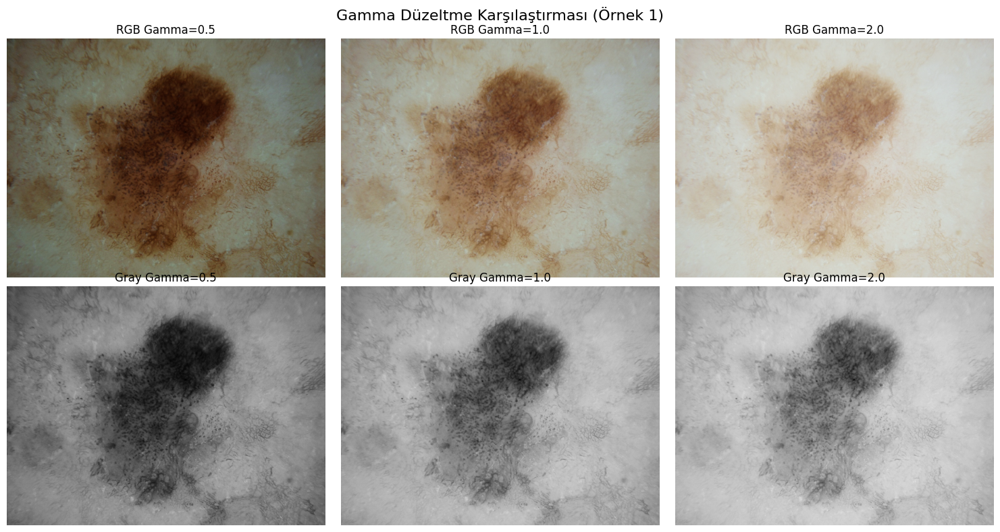

In [12]:
def adjust_gamma(image, gamma=1.0):
    # Gamma düzeltme için Lookup Table (LUT) oluşturma
    # Bu yöntem, her piksel için tek tek üs almak yerine çok daha hızlıdır.
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")

    # LUT uygulama
    return cv2.LUT(image, table)

# Görselleştirme (Sadece 1 örnek üzerinde farklı gamma değerleri)
gamma_values = [0.5, 1.0, 2.0]
sample_idx = 0  # İlk görüntüyü kullanalım

# Görüntüyü al
row = sample_images.iloc[sample_idx]
img_bgr = cv2.imread(row['path'])
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.suptitle(f"Gamma Düzeltme Karşılaştırması (Örnek {sample_idx+1})", fontsize=16)

# RGB İçin Döngü
for i, gamma in enumerate(gamma_values):
    corrected = adjust_gamma(img_rgb, gamma=gamma)
    plt.subplot(2, 3, i+1)
    plt.imshow(corrected)
    plt.title(f"RGB Gamma={gamma}")
    plt.axis('off')

# Grayscale İçin Döngü
for i, gamma in enumerate(gamma_values):
    corrected_gray = adjust_gamma(img_gray, gamma=gamma)
    plt.subplot(2, 3, i+4)
    plt.imshow(corrected_gray, cmap='gray')
    plt.title(f"Gray Gamma={gamma}")
    plt.axis('off')

plt.tight_layout()
plt.show()

Yorum:
    Gamma = 0.5: Görüntü parlar, gölgede kalan karanlık detaylar görünür hale gelir.
    Gamma = 1.0: Orijinal görüntü ile aynıdır.
    Gamma = 2.0: Görüntü kararır, sadece çok parlak alanlar görünür kalır.

### 4. Gürültü Azaltma

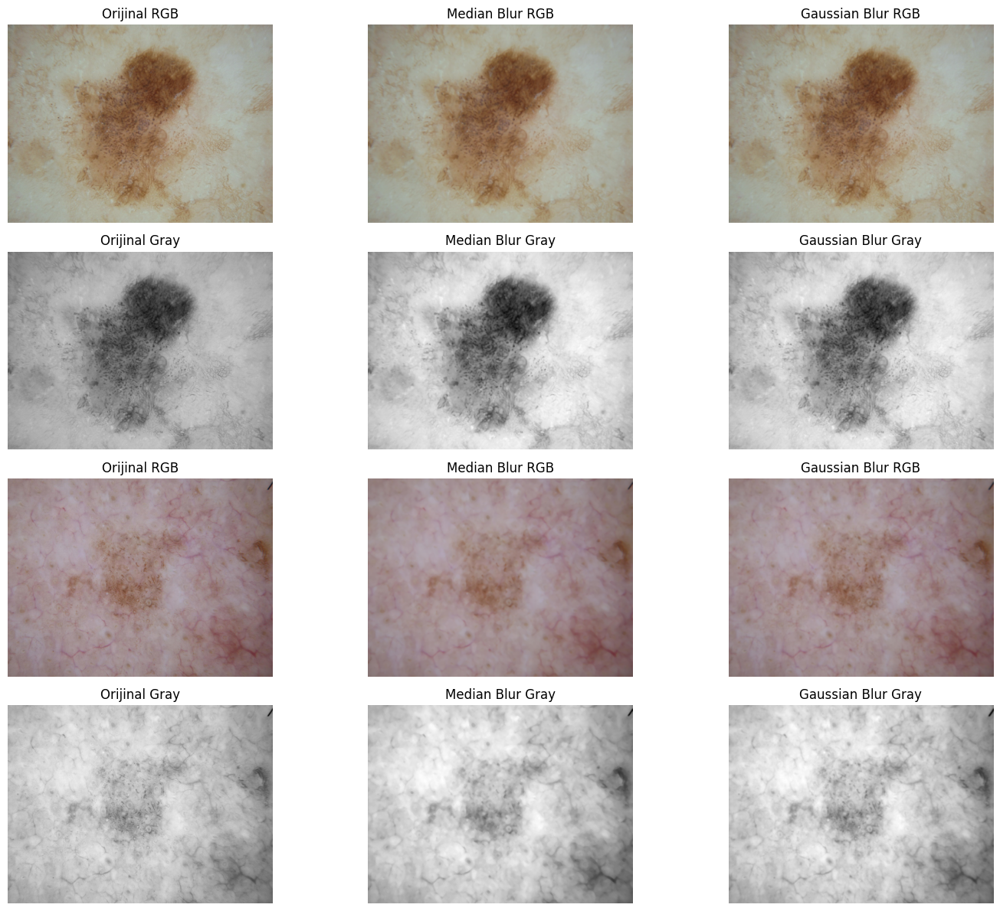

In [13]:
# Görselleştirme için ilk 2 örneği kullanalım
num_samples_to_show = 2
plt.figure(figsize=(15, 6 * num_samples_to_show))

for i in range(num_samples_to_show):
    # Veriyi al
    if i >= len(sample_images): break
    img_path = sample_images.iloc[i]['path']
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: continue

    # Dönüşümler
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # --- 4.1 Median Blur Uygulama ---
    # Kernel boyutu tek sayı olmalı (örn: 5, 7)
    median_rgb = cv2.medianBlur(img_rgb, 5)
    median_gray = cv2.medianBlur(img_gray, 5)

    # --- 4.2 Gaussian Blur Uygulama ---
    # (5, 5) kernel boyutu, 0 standart sapma (otomatik hesaplanır)
    gaussian_rgb = cv2.GaussianBlur(img_rgb, (5, 5), 0)
    gaussian_gray = cv2.GaussianBlur(img_gray, (5, 5), 0)

    # --- Çizim (RGB ve Grayscale Karşılaştırmalı) ---
    # 1. Satır: RGB (Orijinal - Median - Gaussian)
    plt.subplot(num_samples_to_show * 2, 3, i*6 + 1)
    plt.imshow(img_rgb)
    plt.title("Orijinal RGB")
    plt.axis('off')

    plt.subplot(num_samples_to_show * 2, 3, i*6 + 2)
    plt.imshow(median_rgb)
    plt.title("Median Blur RGB")
    plt.axis('off')

    plt.subplot(num_samples_to_show * 2, 3, i*6 + 3)
    plt.imshow(gaussian_rgb)
    plt.title("Gaussian Blur RGB")
    plt.axis('off')

    # 2. Satır: Grayscale (Orijinal - Median - Gaussian)
    plt.subplot(num_samples_to_show * 2, 3, i*6 + 4)
    plt.imshow(img_gray, cmap='gray')
    plt.title("Orijinal Gray")
    plt.axis('off')

    plt.subplot(num_samples_to_show * 2, 3, i*6 + 5)
    plt.imshow(median_gray, cmap='gray')
    plt.title("Median Blur Gray")
    plt.axis('off')

    plt.subplot(num_samples_to_show * 2, 3, i*6 + 6)
    plt.imshow(gaussian_gray, cmap='gray')
    plt.title("Gaussian Blur Gray")
    plt.axis('off')

plt.tight_layout()
plt.show()

- Median Blur kenarları daha iyi korur mu?

Median filtresi, piksellerin ortanca değerini aldığı için keskin kenarları Gaussian kadar bulanıklaştırmaz.

- Gaussian Blur detay kaybına neden oluyor mu?

Evet. Gaussian blur, tüm piksellerin ağırlıklı ortalamasını aldığı için görüntüyü daha smooth hale getirir.

### 5. Döndürme ve Ayna Çevirme (Flipping)

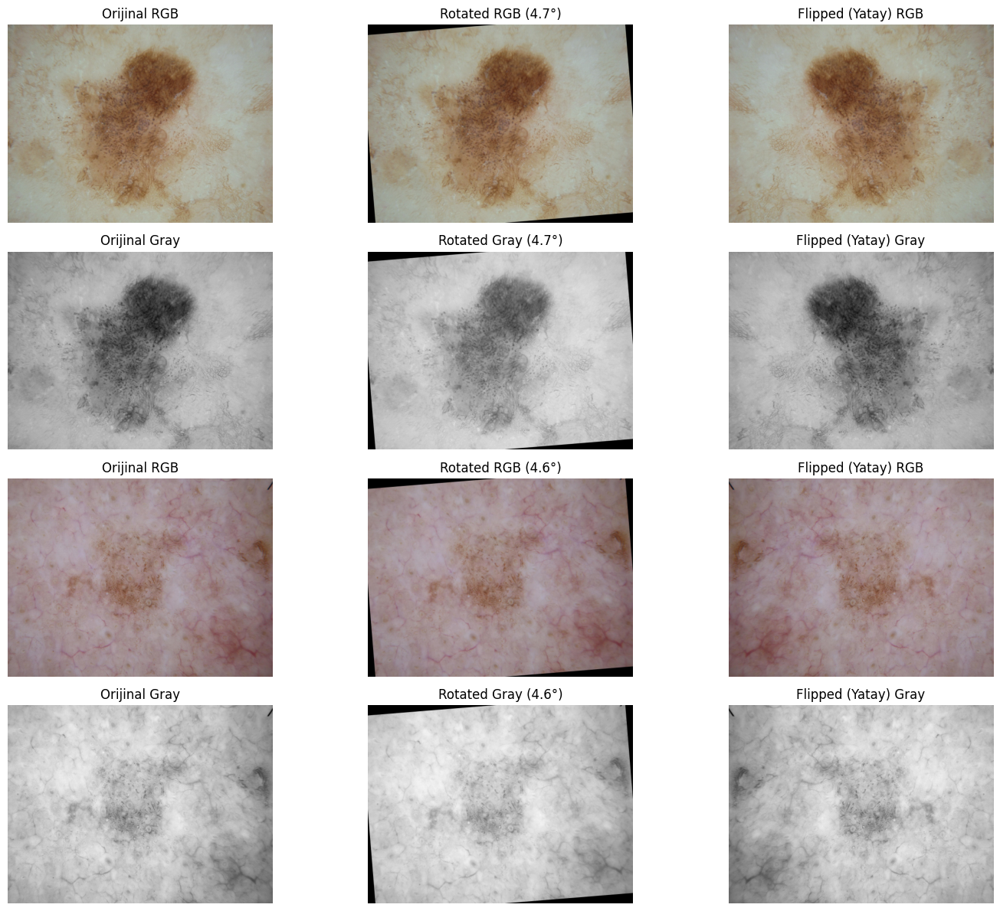

In [14]:
import random

plt.figure(figsize=(15, 6 * num_samples_to_show))

for i in range(num_samples_to_show):
    if i >= len(sample_images): break
    img_path = sample_images.iloc[i]['path']
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: continue

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    rows, cols = img_rgb.shape[:2]

    # --- 5.1 Rastgele Döndürme (0-10 Derece) [cite: 72-74] ---
    angle = random.uniform(0, 10) # 0 ile 10 arasında rastgele float sayı
    M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1) # Dönüşüm matrisi

    rotated_rgb = cv2.warpAffine(img_rgb, M, (cols, rows))
    rotated_gray = cv2.warpAffine(img_gray, M, (cols, rows))

    # --- 5.2 Yatay Ayna Çevirme (Flip) [cite: 75-76] ---
    # 1: Yatay, 0: Dikey, -1: Her iki eksen
    flipped_rgb = cv2.flip(img_rgb, 1)
    flipped_gray = cv2.flip(img_gray, 1)

    # --- Çizim ---
    # 1. Satır: RGB İşlemleri
    plt.subplot(num_samples_to_show * 2, 3, i*6 + 1)
    plt.imshow(img_rgb)
    plt.title("Orijinal RGB")
    plt.axis('off')

    plt.subplot(num_samples_to_show * 2, 3, i*6 + 2)
    plt.imshow(rotated_rgb)
    plt.title(f"Rotated RGB ({angle:.1f}°)")
    plt.axis('off')

    plt.subplot(num_samples_to_show * 2, 3, i*6 + 3)
    plt.imshow(flipped_rgb)
    plt.title("Flipped (Yatay) RGB")
    plt.axis('off')

    # 2. Satır: Grayscale İşlemleri
    plt.subplot(num_samples_to_show * 2, 3, i*6 + 4)
    plt.imshow(img_gray, cmap='gray')
    plt.title("Orijinal Gray")
    plt.axis('off')

    plt.subplot(num_samples_to_show * 2, 3, i*6 + 5)
    plt.imshow(rotated_gray, cmap='gray')
    plt.title(f"Rotated Gray ({angle:.1f}°)")
    plt.axis('off')

    plt.subplot(num_samples_to_show * 2, 3, i*6 + 6)
    plt.imshow(flipped_gray, cmap='gray')
    plt.title("Flipped (Yatay) Gray")
    plt.axis('off')

plt.tight_layout()
plt.show()

- Simetri Farkları:

Deri lezyonları genellikle asimetriktir (özellikle melanom şüphesi olanlar). Yatay çevirme işlemi (flip) yapıldığında, lezyonun şekli simetrik değilse (bir tarafı diğerinden farklıysa) görüntü tamamen farklı bir lezyonmuş gibi algılanabilir.

- Döndürme Etkisi:

Küçük açılı (0-10 derece) döndürmelerde, görüntü kenarlarında siyah boşluklar oluşabilir (kodda warpAffine işlemi dolgu yapmadığı için). Bu, veri artırma sırasında dikkate alınması gereken bir durumdur.

### 6. Frekans Alanında Filtreleme (FFT)

#### 6.1 Fourier Dönüşümü

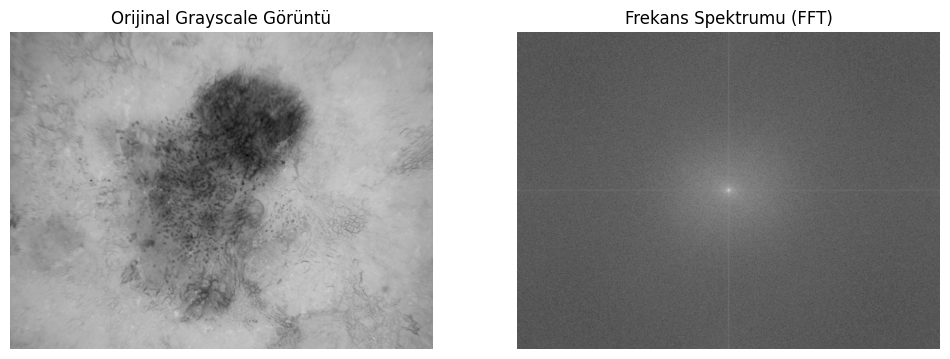

In [15]:
row = sample_images.iloc[0]
img_path = row['path']
img_bgr = cv2.imread(img_path)

if img_bgr is not None:
    # 1. RGB -> Grayscale dönüşümü (FFT gri tonda yapılır)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # 2. 2D Fourier Dönüşümü Hesaplama
    f = np.fft.fft2(img_gray)

    # 3. Sıfır frekans bileşenini merkeze kaydırma (Shift)
    fshift = np.fft.fftshift(f)

    # 4. Frekans spektrumunu görselleştirme (Logaritmik ölçek)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

    # Görselleştirme
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title('Orijinal Grayscale Görüntü')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('Frekans Spektrumu (FFT)')
    plt.axis('off')

    plt.show()
else:
    print("Görüntü yüklenemedi.")

#### 6.2 Alçak Geçiren Filtre Uygulama

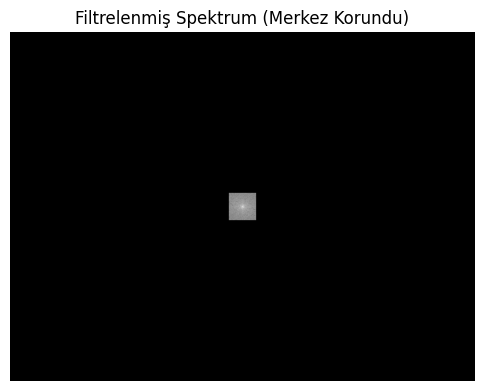

In [16]:
# Görüntü boyutlarını al
rows, cols = img_gray.shape
crow, ccol = rows // 2, cols // 2  # Merkez noktası

# 1. Maske Oluşturma (Low Pass Filter)
# Merkezde beyaz (1), kenarlarda siyah (0)
r = 30  # Yarıçap (Bu değeri değiştirerek bulanıklığı artırıp azaltabilirsiniz)
mask = np.zeros((rows, cols), np.uint8)
mask[crow-r:crow+r, ccol-r:ccol+r] = 1

# 2. Maskeyi Frekans Uzayına Uygulama
fshift_filtered = fshift * mask

# Filtrelenmiş spektrumun görselleştirilmesi (Opsiyonel analiz için)
magnitude_spectrum_filtered = 20 * np.log(np.abs(fshift_filtered) + 1)

plt.figure(figsize=(6, 6))
plt.imshow(magnitude_spectrum_filtered, cmap='gray')
plt.title('Filtrelenmiş Spektrum (Merkez Korundu)')
plt.axis('off')
plt.show()

#### 6.3 Ters Fourier (Inverse FFT)

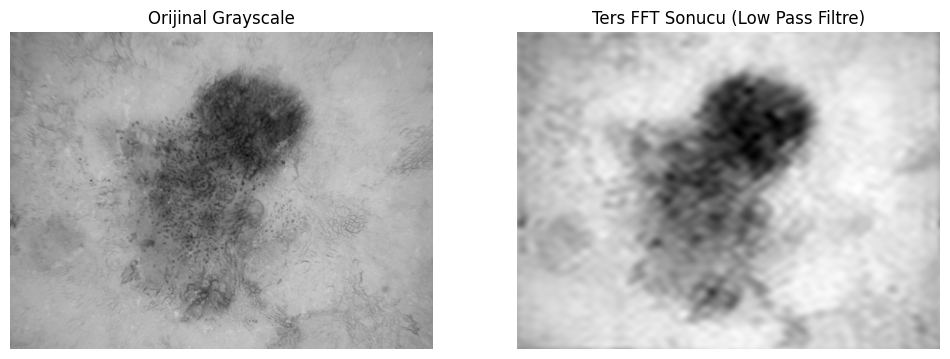

In [17]:
# 1. Merkezi Geri Kaydırma (Inverse Shift)
f_ishift = np.fft.ifftshift(fshift_filtered)

# 2. Ters FFT Uygulama
img_back = np.fft.ifft2(f_ishift)

# 3. Mutlak Değer Alma (Karmaşık sayıdan gerçel sayıya)
img_back = np.abs(img_back)

# Sonucu Gösterme
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Orijinal Grayscale')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_back, cmap='gray')
plt.title('Ters FFT Sonucu (Low Pass Filtre)')
plt.axis('off')

plt.show()

#### 6.4 Karşılaştırma

Frekans Spektrumu: İlk grafikteki (6.1) merkezdeki parlak nokta, görüntünün genel yapısını (düşük frekansları) temsil ederken, etrafa yayılan noktalar kenarları ve ince detayları temsil eder.

Maske Etkisi: 6.2'de uyguladığımız maske ile sadece merkezi alıp kenarları sildik. Bu işlem, görüntünün keskinlik bilgisini yok etmiştir.

Sonuç: 6.3'teki sonuç görüntüsü, orijinaline göre bulanıklaşmıştır. Bunun nedeni, keskin kenarları oluşturan yüksek frekanslı sinyallerin filtrelenmiş olmasıdır. Bu işlem teknik olarak Gaussian Blur etkisi yapmıştır.

### 7. Keskinleştirme ve Enterpolasyon

#### 7.1 Unsharp Masking ile Keskinleştirme

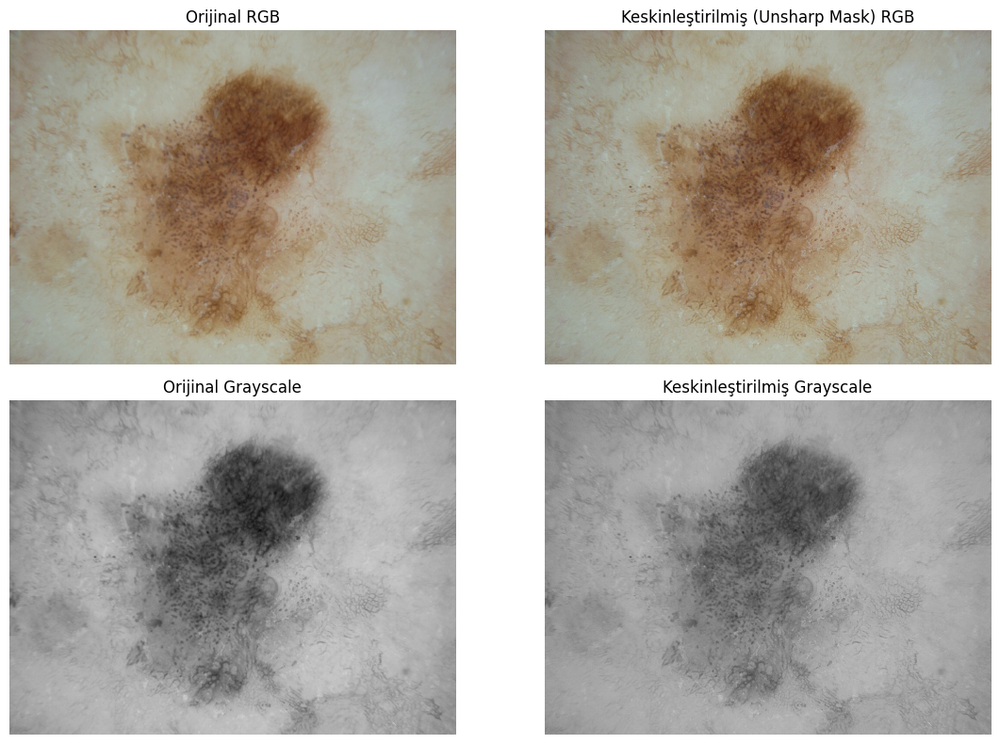

In [18]:
row = sample_images.iloc[0]
img_path = row['path']
img_bgr = cv2.imread(img_path)

if img_bgr is not None:
    # Hazırlık
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # --- Unsharp Masking Fonksiyonu ---
    def unsharp_mask(image, kernel_size=(5, 5), sigma=1.0, amount=1.5, threshold=0):
        """
        Görüntüye Unsharp Masking uygular.
        Formül: Sharpened = Original + (Original - Blurred) * Amount
        Basitleştirilmiş: Sharpened = Original * (1 + Amount) - Blurred * Amount
        """
        blurred = cv2.GaussianBlur(image, kernel_size, sigma)
        sharpened = float(amount + 1) * image - float(amount) * blurred
        sharpened = np.maximum(sharpened, 0)
        sharpened = np.minimum(sharpened, 255)
        return sharpened.astype(np.uint8)

    # 1. RGB Üzerinde Keskinleştirme
    sharp_rgb = unsharp_mask(img_rgb, sigma=1.0, amount=1.5)

    # 2. Grayscale Üzerinde Keskinleştirme
    sharp_gray = unsharp_mask(img_gray, sigma=1.0, amount=1.5)

    # --- Görselleştirme (Keskinleştirme) ---
    plt.figure(figsize=(12, 8))

    # RGB Karşılaştırma
    plt.subplot(2, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Orijinal RGB")
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(sharp_rgb)
    plt.title("Keskinleştirilmiş (Unsharp Mask) RGB")
    plt.axis('off')

    # Grayscale Karşılaştırma
    plt.subplot(2, 2, 3)
    plt.imshow(img_gray, cmap='gray')
    plt.title("Orijinal Grayscale")
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(sharp_gray, cmap='gray')
    plt.title("Keskinleştirilmiş Grayscale")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

else:
    print("Görüntü yüklenemedi.")

#### 7.2 Bicubic Enterpolasyon

Orijinal Boyut: 1024x768
Büyütülmüş Boyut: 2048x1536


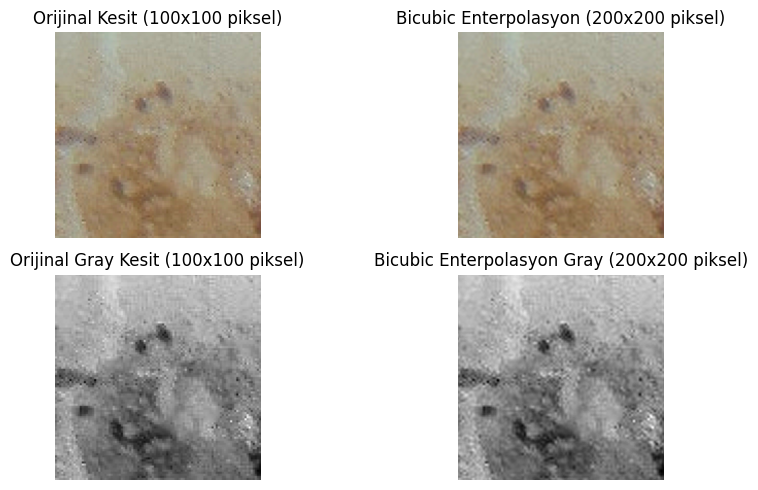

In [19]:
# Görüntü boyutlarını alma
h, w = sharp_rgb.shape[:2]

# 1. RGB Büyütme (2x Zoom)
# fx=2, fy=2 parametreleri genişlik ve yüksekliği 2 katına çıkarır
zoomed_rgb = cv2.resize(sharp_rgb, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

# 2. Grayscale Büyütme (2x Zoom)
zoomed_gray = cv2.resize(sharp_gray, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

# Yeni boyutları yazdırma
print(f"Orijinal Boyut: {w}x{h}")
print(f"Büyütülmüş Boyut: {zoomed_rgb.shape[1]}x{zoomed_rgb.shape[0]}")

# --- Görselleştirme (Detay Kaybını Görmek İçin Crop Alalım) ---
start_row, start_col = h // 4, w // 4
end_row, end_col = start_row + 100, start_col + 100

# Orijinalden kesit (Küçük)
crop_original = sharp_rgb[start_row:end_row, start_col:end_col]
crop_original_gray = sharp_gray[start_row:end_row, start_col:end_col]

# Büyütülmüşten aynı bölgenin karşılığı (2 kat büyük koordinatlar)
crop_zoomed = zoomed_rgb[start_row*2:end_row*2, start_col*2:end_col*2]
crop_zoomed_gray = zoomed_gray[start_row*2:end_row*2, start_col*2:end_col*2]

plt.figure(figsize=(10, 5))

plt.subplot(2, 2, 1)
plt.imshow(crop_original)
plt.title(f"Orijinal Kesit (100x100 piksel)")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(crop_zoomed)
plt.title(f"Bicubic Enterpolasyon (200x200 piksel)")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(crop_original_gray, cmap='gray')
plt.title(f"Orijinal Gray Kesit (100x100 piksel)")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(crop_zoomed_gray, cmap='gray')
plt.title(f"Bicubic Enterpolasyon Gray (200x200 piksel)")
plt.axis('off')

plt.tight_layout()
plt.show()

Kalite: Bicubic enterpolasyon, görüntüyü büyütürken piksellerin arasına yeni pikseller ekler. Bunu yaparken çevredeki 16 pikselin ağırlıklı ortalamasını alır.

Sonuç: Büyütülmüş görüntüde (sağda), pikselleşme (blok blok görünüm) yerine daha yumuşak kenarlar görülür. Ancak, gerçek bir "yeni detay" eklenmediği için görüntü biraz "bulanık" (soft) görünebilir. Keskinleştirme işlemi (7.1) bu bulanıklığı bir miktar telafi etmiştir.